In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from ydata_profiling import ProfileReport

%matplotlib inline

pd.options.mode.chained_assignment = None  # default='warn'

# your code that triggers the warning goes here

pd.options.mode.chained_assignment = 'warn'  # set it back to the default value


In [108]:
# read parquet file
df = pd.read_parquet('Daten/Tickets letzte 12 Monate.parquet')

# print shape of dataframe 
print(df.shape)
print(df.columns)
display(df)

(63512, 30)
Index(['Nummer', 'Erstellt', 'Lösungszeit', 'Meldeberechtigter',
       'Organisation', 'Anfrager', 'Kanal', 'Lieferant', 'Serviceangebot',
       'Aktualisiert', 'Betreff', 'Beschreibung', 'Auflösungshinweise',
       'Problem-Link', 'Major Incident', 'Zuweisungsgruppe', 'Zugewiesen an',
       'Externe Referenz', 'Service Element', 'Kategorie', 'Unterkategorie',
       'Status', 'Dringlichkeit', 'Priorität', 'Abteilung', 'Ort',
       'Auswirkung', 'Gelöst', 'SLA def processing breached',
       'SLA def reaction breached'],
      dtype='object')


,Nummer,Erstellt,Lösungszeit,Meldeberechtigter,Organisation,Anfrager,Kanal,Lieferant,Serviceangebot,Aktualisiert,...,Unterkategorie,Status,Dringlichkeit,Priorität,Abteilung,Ort,Auswirkung,Gelöst,SLA def processing breached,SLA def reaction breached
0,INC475189,44773.541250,1162838.0,"Widmer Manus, JUSTICE-STAW-BJS-Biel",JUSTICE,None,Service Portal,None,SOF: Support Applikation Tribuna Anonymisierun...,44787.000023,...,Software,Geschlossen,Mittel,Tief,Staatsanwaltschaft Berner Jura-Seeland,"Spitalstrasse 11, 2501 Biel-Bienne",mehrere Arbeitsplätze,44773.692975,False,False
1,INC475187,44773.432211,826745.0,"Saxer Vera, GSI-ZSHKK","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF-CS: Profile,44783.001019,...,Benutzer Administration,Geschlossen,Tief,Tief,Zentrum für Sozial- und Heilpädagogik Köniz-Ke...,"Landorfstrasse 94, 3098 Köniz",einzelner Arbeitsplatz,44775.291354,False,False
2,INC475186,44773.226042,1967711.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,"Tedde Tamara, SID-AJV-RGMO",Service Portal,None,SOF: Fachapplikation nicht definiert (SID-AJV),44796.000475,...,Benutzer Administration,Geschlossen,Tief,Tief,AJV Regionalgefängnis Moutier,"Rue du Château 30b, 2740 Moutier",einzelner Standort,44788.649132,False,False
3,INC475185,44772.958310,1089274.0,"Schwander Sarah, SID-AJV-RGBU-SL",Sicherheitsdirektion,None,Service Portal,None,SOF-CS: Profile,44785.565648,...,Software,Geschlossen,Tief,Mittel,AJV_RGBU Sicherheit / Loge,"Dunantstrasse 9, 3400 Burgdorf",mehrere Standorte,44781.378044,False,False
4,INC475184,44772.912060,871685.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,None,Service Portal,None,SOF: Support Applikation GINA (SID),44783.001007,...,System Administration,Geschlossen,Tief,Tief,AJV_RGMO Betreuung,"Rue du Château 30b, 2740 Moutier",einzelner Standort,44775.332801,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63507,INC510847,44896.295995,4033.0,"Ranieri Christine, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Service Portal,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44902.000081,...,Software,Geschlossen,Hoch,Hoch,SV-GBPS-JBSL - Region Seeland,"Bahnhofplatz 10, 2502 Biel-Bienne",mehrere Standorte,44896.342303,False,False
63508,INC510846,44896.295949,11.0,"Trachsel Fritz, SID-SVSA-VPZBO-FUPBO",Sicherheitsdirektion,None,Telefon,None,SOF-CS: Profile,44896.295949,...,Benutzer Administration,Geschlossen,Tief,Tief,SVSA Führerprüfungen BO,"Tempelstrasse 30, 3608 Thun",einzelner Arbeitsplatz,44896.295949,False,False
63509,INC510844,44896.295556,611683.0,"Winkelmann Melanie, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.375220,...,Software,Geschlossen,Hoch,Tief,SV-GBPS-JBSL - Region Seeland,"Bahnhofplatz 10, 2502 Biel-Bienne",einzelner Arbeitsplatz,44896.342500,False,False
63510,INC510843,44896.295000,615327.0,"Gfeller Eveline, BVD-TBA-DLZ",Bau- und Verkehrsdirektion,"Reusser Johann, BVD-TBA-DLZ",Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.416840,...,Software,Geschlossen,Hoch,Tief,TBA-DLZ,"Reiterstrasse 11, 3013 Bern",einzelner Arbeitsplatz,44896.406250,False,False


In [3]:
profile = ProfileReport(df, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df[['Kategorie', 'Unterkategorie']]


# count number of ticket per category
df['Kategorie'].value_counts()
# create plot 
fig = px.histogram(df, x="Kategorie", title='Anzahl Tickets pro Kategorie')
fig.show()


In [5]:
df['Unterkategorie'].value_counts()
# create plot
fig = px.histogram(df, x="Unterkategorie", title='Anzahl Tickets pro Unterkategorie')
fig.show()

In [6]:
# create column combination with Kategorie and Unterkategorie
df['Kategorie_Unterkategorie'] = df['Kategorie'] + ' - ' + df['Unterkategorie']
df['Kategorie_Unterkategorie'].value_counts()

# create plot
fig = px.histogram(df, x="Kategorie_Unterkategorie", title='Anzahl Tickets pro Kategorie und Unterkategorie')
fig.show()


In [7]:
df['Zuweisungsgruppe'].value_counts()
# create plot
fig = px.histogram(df, x="Zuweisungsgruppe", title='Anzahl Tickets pro Zuweisungsgruppe')
fig.show()

In [8]:
# Create a column combination of zuweisungsgrupp and kategorie 
df['Zuweisungsgruppe_Kategorie'] = df['Zuweisungsgruppe'] + ' - ' + df['Kategorie']
df['Zuweisungsgruppe_Kategorie'].value_counts()

# create plot
fig = px.histogram(df, x="Zuweisungsgruppe_Kategorie", title='Anzahl Tickets pro Zuweisungsgruppe und Kategorie')
fig.show()


In [9]:
# create zuweisungsgruppe and kategorie and unterkategorie combinations
df['Zuweisungsgruppe_Kategorie_Unterkategorie'] = df['Zuweisungsgruppe'] + ' - ' + df['Kategorie'] + ' - ' + df['Unterkategorie']
df['Zuweisungsgruppe_Kategorie_Unterkategorie'].value_counts()

# create plot
fig = px.histogram(df, x="Zuweisungsgruppe_Kategorie_Unterkategorie", title='Anzahl Tickets pro Zuweisungsgruppe, Kategorie und Unterkategorie')
fig.show()




In [10]:
%matplotlib inline

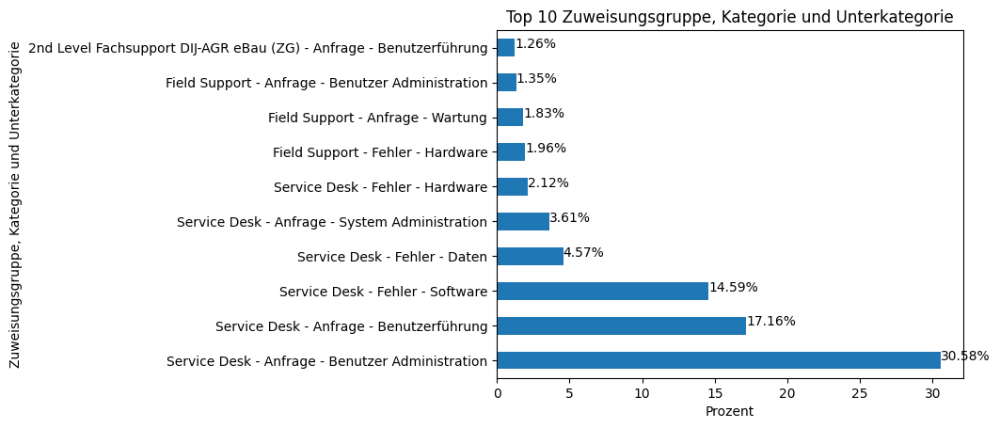

In [11]:
(df["Zuweisungsgruppe_Kategorie_Unterkategorie"].value_counts() / len(df) * 100).head(10).plot(kind = "barh")
# add procent value to bar
for index, value in enumerate((df["Zuweisungsgruppe_Kategorie_Unterkategorie"].value_counts() / len(df) * 100).head(10)):
    plt.text(value, index, str(round(value, 2)) + '%')
plt.title("Top 10 Zuweisungsgruppe, Kategorie und Unterkategorie")
plt.xlabel("Prozent")
plt.ylabel("Zuweisungsgruppe, Kategorie und Unterkategorie")
plt.show()



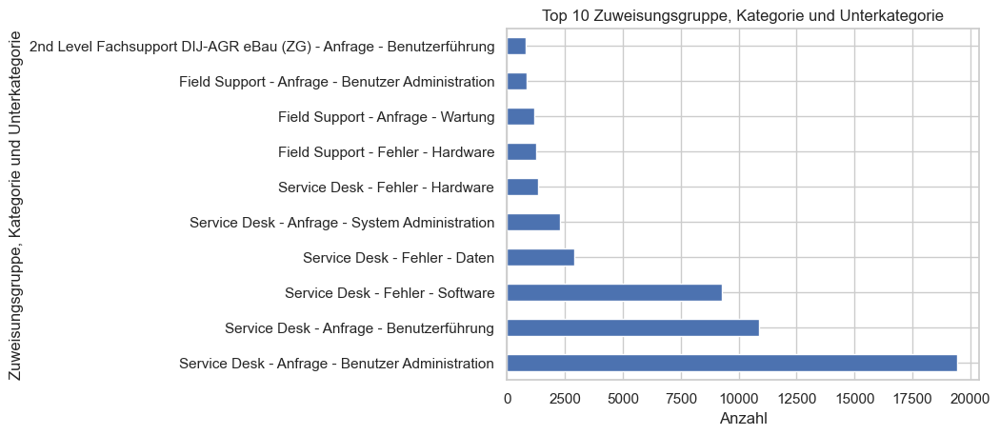

In [12]:
# Use seaborn to crreate stacked bar
sns.set_theme(style="whitegrid")
df['Zuweisungsgruppe_Kategorie_Unterkategorie'].value_counts().head(10).plot(kind = "barh", stacked=True)
plt.title("Top 10 Zuweisungsgruppe, Kategorie und Unterkategorie")
plt.xlabel("Anzahl")
plt.ylabel("Zuweisungsgruppe, Kategorie und Unterkategorie")
plt.show()



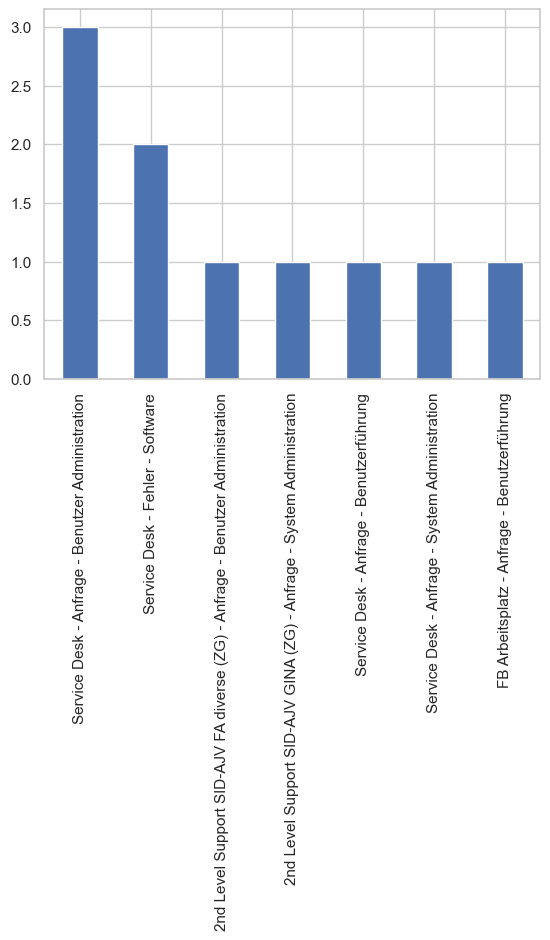

In [13]:
df["Zuweisungsgruppe_Kategorie_Unterkategorie"].head(10).value_counts().plot(kind="bar")
plt.show()

In [109]:
df["Beschreibung"]

# displau Betreff, Beschreibung and Auflösunghinweise
df_text = df[['Betreff', 'Beschreibung', 'Auflösungshinweise']]

# preprocess df_text columns 

display(df_text)

,Betreff,Beschreibung,Auflösungshinweise
0,Tribuna funktioniert nicht - kommt ständig ein...,siehe oben\n\n--------------------------\nCate...,File System des Datenbank Systems ist vollgela...
1,"Passwort zurücksetzen für Saxer Vera, GSI-ZSHK...",Guten Tag\n\nIch habe untenstehende Mail erhal...,Guten Morgen Frau Saxer \nBesten Dank für die ...
2,Merci d'ouvrir les accès intranet AJV-RGMO à T...,les accès intranet AJV-RGMO à Tamara Tedde (mm...,Dieses Ticket gibt es in doppelter Ausführung....
3,Kein Zugriff mehr auf den Hauptposteingang und...,\n\n--------------------------\nCategory : Sof...,Der Fehler konnte behoben werden.
4,Personne détenue en doublon,La personne détenue n'a été entrée qu'une seul...,Guten Tag\n\nDie ID Person 201691 ist nur einm...
...,...,...,...
63507,Grossstörung: Nesko-Frontend kann nicht gestar...,Technischer Fehler im Nesko Frontend bei Mutat...,Die Störung konnte durch den Lieferanten behob...
63508,Entsperrung Account,None,Der Account wurde ohne Zurücksetzen des Passwo...
63509,"Nesko Frontend, VA-NP arbeiten nicht möglich",\n\n--------------------------\nCategory : Sof...,Die Störung konnte durch den Lieferanten behob...
63510,das FIS funktioniert nicht,wir können das FIS nicht starten\n\n----------...,Der FIS Zugriff funktioniert nun bei Frau Gfel...


In [110]:
def process_captions(data, column):
    data[column] = data[column].apply(lambda x: x.replace('\n', ' '))
    data[column] = data[column].apply(lambda x: x.replace('-', ' '))
    data[column] = data[column].apply(lambda x: x.lower())
    data[column] = data[column].apply(lambda x: x.replace('[^A-Za-z]', ''))
    return data[column]


# change datatype of columns to string
df_text['Betreff'] = df_text['Betreff'].astype(str).copy()
df_text['Beschreibung'] = df_text['Beschreibung'].astype(str).copy()
df_text['Auflösungshinweise'] = df_text['Auflösungshinweise'].astype(str).copy()

df_text['Betreff'] = process_captions(df_text, 'Betreff').copy()
df_text['Beschreibung'] = process_captions(df_text, 'Beschreibung').copy()
df_text['Auflösungshinweise'] = process_captions(df_text, 'Auflösungshinweise').copy()

display(df_text)

C:\Users\Si Ben Tran\AppData\Local\Temp\ipykernel_13876\4228194458.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Si Ben Tran\AppData\Local\Temp\ipykernel_13876\4228194458.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Si Ben Tran\AppData\Local\Temp\ipykernel_13876\4228194458.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pa

,Betreff,Beschreibung,Auflösungshinweise
0,tribuna funktioniert nicht kommt ständig ein...,siehe oben categor...,file system des datenbank systems ist vollgela...
1,"passwort zurücksetzen für saxer vera, gsi zshk...",guten tag ich habe untenstehende mail erhalte...,guten morgen frau saxer besten dank für die i...
2,merci d'ouvrir les accès intranet ajv rgmo à t...,les accès intranet ajv rgmo à tamara tedde (mm...,dieses ticket gibt es in doppelter ausführung....
3,kein zugriff mehr auf den hauptposteingang und...,category : softwa...,der fehler konnte behoben werden.
4,personne détenue en doublon,la personne détenue n'a été entrée qu'une seul...,guten tag die id person 201691 ist nur einmal...
...,...,...,...
63507,grossstörung: nesko frontend kann nicht gestar...,technischer fehler im nesko frontend bei mutat...,die störung konnte durch den lieferanten behob...
63508,entsperrung account,none,der account wurde ohne zurücksetzen des passwo...
63509,"nesko frontend, va np arbeiten nicht möglich",category : softwa...,die störung konnte durch den lieferanten behob...
63510,das fis funktioniert nicht,wir können das fis nicht starten ...,der fis zugriff funktioniert nun bei frau gfel...


In [20]:
df_text[['Betreff', 'Beschreibung']]

# export to parquet file
df_text.to_parquet('Daten/Betreff_Beschreibung_cleaned.parquet')
# export to xslx file
df_text.to_excel('Daten/Betreff_Beschreibung_cleaned.xlsx')



In [111]:
# read parquet file
df_text = pd.read_parquet('Daten/Tickets letzte 12 Monate Text.parquet')


# print shape of dataframe
print(df_text.shape)
print(df_text.columns)
display(df_text)


(63512, 3)
Index(['Betreff', 'Beschreibung', 'Auflösungshinweise'], dtype='object')


,Betreff,Beschreibung,Auflösungshinweise
0,tribuna funktioniert nicht kommt ständig ein...,siehe oben categor...,file system des datenbank systems ist vollgela...
1,"passwort zurücksetzen für saxer vera, gsi zshk...",guten tag ich habe untenstehende mail erhalte...,guten morgen frau saxer besten dank für die i...
2,merci d'ouvrir les accès intranet ajv rgmo à t...,les accès intranet ajv rgmo à tamara tedde (mm...,dieses ticket gibt es in doppelter ausführung....
3,kein zugriff mehr auf den hauptposteingang und...,category : softwa...,der fehler konnte behoben werden.
4,personne détenue en doublon,la personne détenue n'a été entrée qu'une seul...,guten tag die id person 201691 ist nur einmal...
...,...,...,...
63507,grossstörung: nesko frontend kann nicht gestar...,technischer fehler im nesko frontend bei mutat...,die störung konnte durch den lieferanten behob...
63508,entsperrung account,none,der account wurde ohne zurücksetzen des passwo...
63509,"nesko frontend, va np arbeiten nicht möglich",category : softwa...,die störung konnte durch den lieferanten behob...
63510,das fis funktioniert nicht,wir können das fis nicht starten ...,der fis zugriff funktioniert nun bei frau gfel...


In [22]:
# concat Betreff and Beschreibung 
df_text["Betreff_Beschreibung"] = df_text["Betreff"] + ' ' + df_text["Beschreibung"]
display(df_text)

import requests

stopwords = requests.get("https://raw.githubusercontent.com/stopwords-iso/stopwords-de/master/stopwords-de.txt").text.split("\n")

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(stop_words=stopwords)
tfidf.fit(df_text["Betreff_Beschreibung"])

,Betreff,Beschreibung,Auflösungshinweise,Betreff_Beschreibung
0,tribuna funktioniert nicht kommt ständig ein...,siehe oben categor...,file system des datenbank systems ist vollgela...,tribuna funktioniert nicht kommt ständig ein...
1,"passwort zurücksetzen für saxer vera, gsi zshk...",guten tag ich habe untenstehende mail erhalte...,guten morgen frau saxer besten dank für die i...,"passwort zurücksetzen für saxer vera, gsi zshk..."
2,merci d'ouvrir les accès intranet ajv rgmo à t...,les accès intranet ajv rgmo à tamara tedde (mm...,dieses ticket gibt es in doppelter ausführung....,merci d'ouvrir les accès intranet ajv rgmo à t...
3,kein zugriff mehr auf den hauptposteingang und...,category : softwa...,der fehler konnte behoben werden.,kein zugriff mehr auf den hauptposteingang und...
4,personne détenue en doublon,la personne détenue n'a été entrée qu'une seul...,guten tag die id person 201691 ist nur einmal...,personne détenue en doublon la personne détenu...
...,...,...,...,...
63507,grossstörung: nesko frontend kann nicht gestar...,technischer fehler im nesko frontend bei mutat...,die störung konnte durch den lieferanten behob...,grossstörung: nesko frontend kann nicht gestar...
63508,entsperrung account,none,der account wurde ohne zurücksetzen des passwo...,entsperrung account none
63509,"nesko frontend, va np arbeiten nicht möglich",category : softwa...,die störung konnte durch den lieferanten behob...,"nesko frontend, va np arbeiten nicht möglich ..."
63510,das fis funktioniert nicht,wir können das fis nicht starten ...,der fis zugriff funktioniert nun bei frau gfel...,das fis funktioniert nicht wir können das fis ...


TfidfVectorizer(stop_words=['a', 'ab', 'aber', 'ach', 'acht', 'achte', 'achten',
                            'achter', 'achtes', 'ag', 'alle', 'allein', 'allem',
                            'allen', 'aller', 'allerdings', 'alles',
                            'allgemeinen', 'als', 'also', 'am', 'an', 'ander',
                            'andere', 'anderem', 'anderen', 'anderer',
                            'anderes', 'anderm', 'andern', ...])

In [37]:
tfidf.vocabulary_

# create tfidf.vocabulary_ into a dataframe 
df_tfidf = pd.DataFrame.from_dict(tfidf.vocabulary_, orient="index")
df_tfidf.sort_values(by=0, ascending=False)

index_dict = {v: k for k, v in tfidf.vocabulary_.items()}


df_tfidf = df_tfidf.reset_index()
df_tfidf.columns = ["word", "index"]
df_tfidf

top_words_i_list = []

num_top_words = 10
import tqdm
from tqdm import tqdm

for i, row in tqdm(df_text.iterrows()):

    #print("")
    #print("Ticket", i+1)
    #print("Top words per document:")
    # extract indices of top words
    top_words = sorted(
        list(enumerate(tfidf.transform([row["Betreff_Beschreibung"]]).toarray()[0])),
        key=lambda x: x[1],
        reverse=True,
    )[:num_top_words]

    # create empty list to store top words 
    top_words_i = []
    # print top words
    for word_index, word_score in top_words:
        #print(index_dict[word_index])
        top_words_i.append(index_dict[word_index])
    
    # append top words to top_words_i_list
    top_words_i_list.append(top_words_i)

    # break to only print first ticket
    #break

63512it [45:29, 23.27it/s]


In [39]:
top_words_i_list[:10]

[['container_xp',
  'tribuna',
  'applikation',
  'dlxpdos',
  'fun',
  'dossier',
  'ent',
  'err',
  'xpert',
  'dll'],
 ['kennwort',
  'saxer',
  'vera',
  'arbeitsplatz',
  'pc',
  'passwort',
  'neues',
  'erfolgreicher',
  'unmittelbar',
  'vermeiden'],
 ['rgmo',
  'intranet',
  'ajv',
  'mml8',
  'tedde',
  'accès',
  'les',
  'oui',
  'tamara',
  'accordés'],
 ['hauptposteingang',
  'kalender',
  'applikation',
  'vorübergehende',
  'offlinemodus',
  'gehalten',
  'erweitert',
  'rgbu',
  'persönliche',
  'exchange'],
 ['doublon',
  'détenus',
  'détenue',
  'personne',
  'gina',
  'clients',
  'dans',
  'application',
  'présents',
  'oui'],
 ['nadarajah',
  'nerusa',
  'ritm104281',
  'verwechselt',
  'vorname',
  'name',
  'grade',
  'mailkontakt',
  'bestellung',
  'kwp'],
 ['ortegon',
  'anmeldeproblem',
  'anmelden',
  'pc',
  'frau',
  '00',
  '000',
  '0000',
  '00000',
  '00000000'],
 ['a3fa',
  'zv',
  'cfs',
  'p_zv_kaza_ct_analyse',
  'backups',
  'ordnern',
  'infr

In [41]:
df_top_words = pd.DataFrame(columns=["top_10_words_each_ticket"])


In [43]:
df_top_words = pd.DataFrame(columns=["top_10_words_each_ticket"])

df_top_words["top_10_words_each_ticket"] = top_words_i_list

df_top_words.reset_index(inplace=True)

display(df_top_words)

# rename columns
df_top_words.columns = ["Ticket_ID", "top_10_words_each_ticket"]

display(df_top_words)


,index,top_10_words_each_ticket
0,0,"[container_xp, tribuna, applikation, dlxpdos, ..."
1,1,"[kennwort, saxer, vera, arbeitsplatz, pc, pass..."
2,2,"[rgmo, intranet, ajv, mml8, tedde, accès, les,..."
3,3,"[hauptposteingang, kalender, applikation, vorü..."
4,4,"[doublon, détenus, détenue, personne, gina, cl..."
...,...,...
63507,63507,"[frontend, ranieri, gelderen, guyer, till, nes..."
63508,63508,"[entsperrung, account, none, 00, 000, 0000, 00..."
63509,63509,"[java, at, jboss, org, interceptorcontext, inv..."
63510,63510,"[fis, zugeordneten, zusammenhang, aufgetreten,..."


,Ticket_ID,top_10_words_each_ticket
0,0,"[container_xp, tribuna, applikation, dlxpdos, ..."
1,1,"[kennwort, saxer, vera, arbeitsplatz, pc, pass..."
2,2,"[rgmo, intranet, ajv, mml8, tedde, accès, les,..."
3,3,"[hauptposteingang, kalender, applikation, vorü..."
4,4,"[doublon, détenus, détenue, personne, gina, cl..."
...,...,...
63507,63507,"[frontend, ranieri, gelderen, guyer, till, nes..."
63508,63508,"[entsperrung, account, none, 00, 000, 0000, 00..."
63509,63509,"[java, at, jboss, org, interceptorcontext, inv..."
63510,63510,"[fis, zugeordneten, zusammenhang, aufgetreten,..."


In [45]:
# concat df with df_top_words["top_10_words_each_ticket"]
df_enhance = pd.concat([df, df_top_words["top_10_words_each_ticket"]], axis=1)
display(df_enhance)

,Nummer,Erstellt,Lösungszeit,Meldeberechtigter,Organisation,Anfrager,Kanal,Lieferant,Serviceangebot,Aktualisiert,...,Abteilung,Ort,Auswirkung,Gelöst,SLA def processing breached,SLA def reaction breached,Kategorie_Unterkategorie,Zuweisungsgruppe_Kategorie,Zuweisungsgruppe_Kategorie_Unterkategorie,top_10_words_each_ticket
0,INC475189,44773.541250,1162838.0,"Widmer Manus, JUSTICE-STAW-BJS-Biel",JUSTICE,None,Service Portal,None,SOF: Support Applikation Tribuna Anonymisierun...,44787.000023,...,Staatsanwaltschaft Berner Jura-Seeland,"Spitalstrasse 11, 2501 Biel-Bienne",mehrere Arbeitsplätze,44773.692975,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[container_xp, tribuna, applikation, dlxpdos, ..."
1,INC475187,44773.432211,826745.0,"Saxer Vera, GSI-ZSHKK","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF-CS: Profile,44783.001019,...,Zentrum für Sozial- und Heilpädagogik Köniz-Ke...,"Landorfstrasse 94, 3098 Köniz",einzelner Arbeitsplatz,44775.291354,False,False,Anfrage - Benutzer Administration,Service Desk - Anfrage,Service Desk - Anfrage - Benutzer Administration,"[kennwort, saxer, vera, arbeitsplatz, pc, pass..."
2,INC475186,44773.226042,1967711.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,"Tedde Tamara, SID-AJV-RGMO",Service Portal,None,SOF: Fachapplikation nicht definiert (SID-AJV),44796.000475,...,AJV Regionalgefängnis Moutier,"Rue du Château 30b, 2740 Moutier",einzelner Standort,44788.649132,False,False,Anfrage - Benutzer Administration,2nd Level Support SID-AJV FA diverse (ZG) - An...,2nd Level Support SID-AJV FA diverse (ZG) - An...,"[rgmo, intranet, ajv, mml8, tedde, accès, les,..."
3,INC475185,44772.958310,1089274.0,"Schwander Sarah, SID-AJV-RGBU-SL",Sicherheitsdirektion,None,Service Portal,None,SOF-CS: Profile,44785.565648,...,AJV_RGBU Sicherheit / Loge,"Dunantstrasse 9, 3400 Burgdorf",mehrere Standorte,44781.378044,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[hauptposteingang, kalender, applikation, vorü..."
4,INC475184,44772.912060,871685.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,None,Service Portal,None,SOF: Support Applikation GINA (SID),44783.001007,...,AJV_RGMO Betreuung,"Rue du Château 30b, 2740 Moutier",einzelner Standort,44775.332801,False,False,Anfrage - System Administration,2nd Level Support SID-AJV GINA (ZG) - Anfrage,2nd Level Support SID-AJV GINA (ZG) - Anfrage ...,"[doublon, détenus, détenue, personne, gina, cl..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63507,INC510847,44896.295995,4033.0,"Ranieri Christine, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Service Portal,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44902.000081,...,SV-GBPS-JBSL - Region Seeland,"Bahnhofplatz 10, 2502 Biel-Bienne",mehrere Standorte,44896.342303,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[frontend, ranieri, gelderen, guyer, till, nes..."
63508,INC510846,44896.295949,11.0,"Trachsel Fritz, SID-SVSA-VPZBO-FUPBO",Sicherheitsdirektion,None,Telefon,None,SOF-CS: Profile,44896.295949,...,SVSA Führerprüfungen BO,"Tempelstrasse 30, 3608 Thun",einzelner Arbeitsplatz,44896.295949,False,False,Anfrage - Benutzer Administration,Service Desk - Anfrage,Service Desk - Anfrage - Benutzer Administration,"[entsperrung, account, none, 00, 000, 0000, 00..."
63509,INC510844,44896.295556,611683.0,"Winkelmann Melanie, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.375220,...,SV-GBPS-JBSL - Region Seeland,"Bahnhofplatz 10, 2502 Biel-Bienne",einzelner Arbeitsplatz,44896.342500,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[java, at, jboss, org, interceptorcontext, inv..."
63510,INC510843,44896.295000,615327.0,"Gfeller Eveline, BVD-TBA-DLZ",Bau- und Verkehrsdirektion,"Reusser Johann, BVD-TBA-DLZ",Telefon,None,SOF: Betrieb Appli

In [ ]:
# export to parquet file
df_enhance.to_parquet('Daten/Top10Words_DataFrame.parquet')
# export to xslx file
df_enhance.to_excel('Daten/Top10Words_DataFrame.xlsx')


In [114]:
# read df_enhance parquet file
df_enhance = pd.read_parquet('Daten/Top10Words_DataFrame.parquet')
df_enhance

,Nummer,Erstellt,Lösungszeit,Meldeberechtigter,Organisation,Anfrager,Kanal,Lieferant,Serviceangebot,Aktualisiert,...,Abteilung,Ort,Auswirkung,Gelöst,SLA def processing breached,SLA def reaction breached,Kategorie_Unterkategorie,Zuweisungsgruppe_Kategorie,Zuweisungsgruppe_Kategorie_Unterkategorie,top_10_words_each_ticket
0,INC475189,44773.541250,1162838.0,"Widmer Manus, JUSTICE-STAW-BJS-Biel",JUSTICE,None,Service Portal,None,SOF: Support Applikation Tribuna Anonymisierun...,44787.000023,...,Staatsanwaltschaft Berner Jura-Seeland,"Spitalstrasse 11, 2501 Biel-Bienne",mehrere Arbeitsplätze,44773.692975,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[container_xp, tribuna, applikation, dlxpdos, ..."
1,INC475187,44773.432211,826745.0,"Saxer Vera, GSI-ZSHKK","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF-CS: Profile,44783.001019,...,Zentrum für Sozial- und Heilpädagogik Köniz-Ke...,"Landorfstrasse 94, 3098 Köniz",einzelner Arbeitsplatz,44775.291354,False,False,Anfrage - Benutzer Administration,Service Desk - Anfrage,Service Desk - Anfrage - Benutzer Administration,"[kennwort, saxer, vera, arbeitsplatz, pc, pass..."
2,INC475186,44773.226042,1967711.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,"Tedde Tamara, SID-AJV-RGMO",Service Portal,None,SOF: Fachapplikation nicht definiert (SID-AJV),44796.000475,...,AJV Regionalgefängnis Moutier,"Rue du Château 30b, 2740 Moutier",einzelner Standort,44788.649132,False,False,Anfrage - Benutzer Administration,2nd Level Support SID-AJV FA diverse (ZG) - An...,2nd Level Support SID-AJV FA diverse (ZG) - An...,"[rgmo, intranet, ajv, mml8, tedde, accès, les,..."
3,INC475185,44772.958310,1089274.0,"Schwander Sarah, SID-AJV-RGBU-SL",Sicherheitsdirektion,None,Service Portal,None,SOF-CS: Profile,44785.565648,...,AJV_RGBU Sicherheit / Loge,"Dunantstrasse 9, 3400 Burgdorf",mehrere Standorte,44781.378044,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[hauptposteingang, kalender, applikation, vorü..."
4,INC475184,44772.912060,871685.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,None,Service Portal,None,SOF: Support Applikation GINA (SID),44783.001007,...,AJV_RGMO Betreuung,"Rue du Château 30b, 2740 Moutier",einzelner Standort,44775.332801,False,False,Anfrage - System Administration,2nd Level Support SID-AJV GINA (ZG) - Anfrage,2nd Level Support SID-AJV GINA (ZG) - Anfrage ...,"[doublon, détenus, détenue, personne, gina, cl..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63507,INC510847,44896.295995,4033.0,"Ranieri Christine, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Service Portal,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44902.000081,...,SV-GBPS-JBSL - Region Seeland,"Bahnhofplatz 10, 2502 Biel-Bienne",mehrere Standorte,44896.342303,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[frontend, ranieri, gelderen, guyer, till, nes..."
63508,INC510846,44896.295949,11.0,"Trachsel Fritz, SID-SVSA-VPZBO-FUPBO",Sicherheitsdirektion,None,Telefon,None,SOF-CS: Profile,44896.295949,...,SVSA Führerprüfungen BO,"Tempelstrasse 30, 3608 Thun",einzelner Arbeitsplatz,44896.295949,False,False,Anfrage - Benutzer Administration,Service Desk - Anfrage,Service Desk - Anfrage - Benutzer Administration,"[entsperrung, account, none, 00, 000, 0000, 00..."
63509,INC510844,44896.295556,611683.0,"Winkelmann Melanie, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.375220,...,SV-GBPS-JBSL - Region Seeland,"Bahnhofplatz 10, 2502 Biel-Bienne",einzelner Arbeitsplatz,44896.342500,False,False,Fehler - Software,Service Desk - Fehler,Service Desk - Fehler - Software,"[java, at, jboss, org, interceptorcontext, inv..."
63510,INC510843,44896.295000,615327.0,"Gfeller Eveline, BVD-TBA-DLZ",Bau- und Verkehrsdirektion,"Reusser Johann, BVD-TBA-DLZ",Telefon,None,SOF: Betrieb Appli

In [115]:
vorcab = np.array(df_enhance["top_10_words_each_ticket"].to_list()).reshape(-1, 1)
print(vorcab)

# convert into datafarme
df_vorcab = pd.DataFrame(vorcab)
df_vorcab.columns = ["top_10_words_each_ticket"]
display(df_vorcab)

# count values
df_vorcab["top_10_words_each_ticket"].value_counts().head(50)




[['container_xp']
 ['tribuna']
 ['applikation']
 ...
 ['vergessen']
 ['verfügung']
 ['kennwort']]


,top_10_words_each_ticket
0,container_xp
1,tribuna
2,applikation
3,dlxpdos
4,fun
...,...
635115,anmeldemaske
635116,maurer
635117,vergessen
635118,verfügung


00                                     27005
000                                    24638
0000                                   22476
00000                                  18503
00000000                               15929
none                                   12360
00000000000000000000000000000000_cn    12159
applikation                             7659
00000000000006714201                    7242
account                                 4456
entsperrung                             4050
passwortrückstellung                    3896
system                                  3712
software                                2364
funktioniert                            2255
fehlermeldung                           2243
auskunft                                2225
grudis                                  2222
frau                                    2201
passwort                                2157
kaio                                    2144
weiterleitung                           2056
empfang   

In [116]:
important_words_df = pd.DataFrame(df_vorcab["top_10_words_each_ticket"].value_counts()).reset_index()  

#display(important_words_df.head(56))

# filter with regex, take only strings
#important_words_df = important_words_df[important_words_df["index"].str.contains(r'[a-zA-Z]')]
# filter if the first 8 charachters are not 

# filter with regex, not numbers 
important_words_df = important_words_df[important_words_df["index"].str.contains(r'[0-9]') == False]
# filter with regex, if none remove
important_words_df = important_words_df[important_words_df["index"] != "none"]


#display(important_words_df.head(56))


top50words = important_words_df["index"].head(50).to_list()

# onehot encoding df_enhance["top_10_words_each_ticket"] with top50words
for word in top50words:

    df_enhance[word] = df_enhance["top_10_words_each_ticket"].apply(lambda x: 1 if word in x else 0)

display(df_enhance.head(10))






,Nummer,Erstellt,Lösungszeit,Meldeberechtigter,Organisation,Anfrager,Kanal,Lieferant,Serviceangebot,Aktualisiert,...,anmelden,de,skype,emm,nesko,bitte,gesperrt,vorhanden,siehe,öffnen
0,INC475189,44773.541250,1162838.0,"Widmer Manus, JUSTICE-STAW-BJS-Biel",JUSTICE,None,Service Portal,None,SOF: Support Applikation Tribuna Anonymisierun...,44787.000023,...,0,0,0,0,0,0,0,0,0,0
1,INC475187,44773.432211,826745.0,"Saxer Vera, GSI-ZSHKK","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF-CS: Profile,44783.001019,...,0,0,0,0,0,0,0,0,0,0
2,INC475186,44773.226042,1967711.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,"Tedde Tamara, SID-AJV-RGMO",Service Portal,None,SOF: Fachapplikation nicht definiert (SID-AJV),44796.000475,...,0,0,0,0,0,0,0,0,0,0
3,INC475185,44772.958310,1089274.0,"Schwander Sarah, SID-AJV-RGBU-SL",Sicherheitsdirektion,None,Service Portal,None,SOF-CS: Profile,44785.565648,...,0,0,0,0,0,0,0,0,0,0
4,INC475184,44772.912060,871685.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,None,Service Portal,None,SOF: Support Applikation GINA (SID),44783.001007,...,0,0,0,0,0,0,0,0,0,0
5,INC475183,44772.689549,890908.0,"Aeschlimann Nicole, FIN-FV",Finanzdirektion,None,Service Portal,None,SOF-CS: Profile,44783.000984,...,0,0,0,0,0,0,0,0,0,0
6,INC475181,44772.383889,658310.0,"Ortegon Annina, SID-AJV-HIBA-VS",Sicherheitsdirektion,None,Telefon,None,SOF-CS: Profile,44780.000035,...,1,0,0,0,0,0,0,0,0,0
7,INC475180,44771.740602,1491257.0,"Bärtschi Michael, GSI-GA","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF: Support und Betrieb KWP-Standard,44789.000521,...,0,0,0,0,0,0,0,0,0,0
8,INC475179,44771.730278,973787.0,"Krempels Johann, GSI-SHE","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF-CS: Hardware,44783.000961,...,0,0,0,0,0,0,0,0,0,0
9,INC475178,44771.731516,973926.0,"Schlup Fabian, FIN-Bedag",Finanzdirektion,None,Telefon,None,SOF: Fachapplikation nicht definiert (FIN),44783.000949,...,0,0,0,0,0,0,0,0,0,0


In [117]:
# export df_enhance to parquet file
df_enhance.to_parquet('Daten/Top50Words_OneHot_DataFrame.parquet')

In [124]:
# export df_enhance to xlsx file
df_enhance.to_excel('Daten/Top50Words_OneHot_DataFrame.xlsx')

In [123]:
# read top50words_onehot parquet file
df_enhance = pd.read_parquet('Daten/Top50Words_OneHot_DataFrame.parquet')
display(df_enhance)

,Nummer,Erstellt,Lösungszeit,Meldeberechtigter,Organisation,Anfrager,Kanal,Lieferant,Serviceangebot,Aktualisiert,...,anmelden,de,skype,emm,nesko,bitte,gesperrt,vorhanden,siehe,öffnen
0,INC475189,44773.541250,1162838.0,"Widmer Manus, JUSTICE-STAW-BJS-Biel",JUSTICE,None,Service Portal,None,SOF: Support Applikation Tribuna Anonymisierun...,44787.000023,...,0,0,0,0,0,0,0,0,0,0
1,INC475187,44773.432211,826745.0,"Saxer Vera, GSI-ZSHKK","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF-CS: Profile,44783.001019,...,0,0,0,0,0,0,0,0,0,0
2,INC475186,44773.226042,1967711.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,"Tedde Tamara, SID-AJV-RGMO",Service Portal,None,SOF: Fachapplikation nicht definiert (SID-AJV),44796.000475,...,0,0,0,0,0,0,0,0,0,0
3,INC475185,44772.958310,1089274.0,"Schwander Sarah, SID-AJV-RGBU-SL",Sicherheitsdirektion,None,Service Portal,None,SOF-CS: Profile,44785.565648,...,0,0,0,0,0,0,0,0,0,0
4,INC475184,44772.912060,871685.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,None,Service Portal,None,SOF: Support Applikation GINA (SID),44783.001007,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63507,INC510847,44896.295995,4033.0,"Ranieri Christine, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Service Portal,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44902.000081,...,0,0,0,0,1,0,0,0,0,0
63508,INC510846,44896.295949,11.0,"Trachsel Fritz, SID-SVSA-VPZBO-FUPBO",Sicherheitsdirektion,None,Telefon,None,SOF-CS: Profile,44896.295949,...,0,0,0,0,0,0,0,0,0,0
63509,INC510844,44896.295556,611683.0,"Winkelmann Melanie, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.375220,...,0,0,0,0,0,0,0,0,0,0
63510,INC510843,44896.295000,615327.0,"Gfeller Eveline, BVD-TBA-DLZ",Bau- und Verkehrsdirektion,"Reusser Johann, BVD-TBA-DLZ",Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.416840,...,0,0,0,0,0,0,0,0,0,0


In [122]:
# filter for skype == 1 
df_enhance[(df_enhance["applikation"] == 1) | (df_enhance["account"] == 1)][["skype", "top_10_words_each_ticket"]]

,skype,top_10_words_each_ticket
0,0,"[container_xp, tribuna, applikation, dlxpdos, ..."
3,0,"[hauptposteingang, kalender, applikation, vorü..."
12,0,"[entsperrung, account, none, 00, 000, 0000, 00..."
20,0,"[schneiter, erich, staw, bm, justice, windows,..."
22,0,"[entsperrung, account, none, 00, 000, 0000, 00..."
...,...,...
63474,0,"[dms, applikation, abschalten, software, probl..."
63483,0,"[entsperrung, account, none, 00, 000, 0000, 00..."
63490,0,"[entsperrung, account, none, 00, 000, 0000, 00..."
63492,0,"[entsperrung, account, none, 00, 000, 0000, 00..."


,Nummer,Erstellt,Lösungszeit,Meldeberechtigter,Organisation,Anfrager,Kanal,Lieferant,Serviceangebot,Aktualisiert,...,anmelden,de,skype,emm,nesko,bitte,gesperrt,vorhanden,siehe,öffnen
0,INC475189,44773.541250,1162838.0,"Widmer Manus, JUSTICE-STAW-BJS-Biel",JUSTICE,None,Service Portal,None,SOF: Support Applikation Tribuna Anonymisierun...,44787.000023,...,0,0,0,0,0,0,0,0,0,0
1,INC475187,44773.432211,826745.0,"Saxer Vera, GSI-ZSHKK","Gesundheits-, Sozial- und Integrationsdirektion",None,Service Portal,None,SOF-CS: Profile,44783.001019,...,0,0,0,0,0,0,0,0,0,0
2,INC475186,44773.226042,1967711.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,"Tedde Tamara, SID-AJV-RGMO",Service Portal,None,SOF: Fachapplikation nicht definiert (SID-AJV),44796.000475,...,0,0,0,0,0,0,0,0,0,0
3,INC475185,44772.958310,1089274.0,"Schwander Sarah, SID-AJV-RGBU-SL",Sicherheitsdirektion,None,Service Portal,None,SOF-CS: Profile,44785.565648,...,0,0,0,0,0,0,0,0,0,0
4,INC475184,44772.912060,871685.0,"Lecomte Fanny, SID-AJV-RGBI-B",Sicherheitsdirektion,None,Service Portal,None,SOF: Support Applikation GINA (SID),44783.001007,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63507,INC510847,44896.295995,4033.0,"Ranieri Christine, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Service Portal,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44902.000081,...,0,0,0,0,1,0,0,0,0,0
63508,INC510846,44896.295949,11.0,"Trachsel Fritz, SID-SVSA-VPZBO-FUPBO",Sicherheitsdirektion,None,Telefon,None,SOF-CS: Profile,44896.295949,...,0,0,0,0,0,0,0,0,0,0
63509,INC510844,44896.295556,611683.0,"Winkelmann Melanie, FIN-SV-GBPS-JBSL-SL",Finanzdirektion,None,Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.375220,...,0,0,0,0,0,0,0,0,0,0
63510,INC510843,44896.295000,615327.0,"Gfeller Eveline, BVD-TBA-DLZ",Bau- und Verkehrsdirektion,"Reusser Johann, BVD-TBA-DLZ",Telefon,None,SOF: Betrieb Applikation NESKO-Frontend (FIN-SV),44903.416840,...,0,0,0,0,0,0,0,0,0,0
